<a href="https://colab.research.google.com/github/sergienko4/deep-learing/blob/main/ex7/ex7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Deep Learning: Ex.7 - **Object detection**

Submitted by: [... **your name and ID** ...]



In [1]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model

import tensorflow_hub as hub  # <---- https://tfhub.dev


# Helper libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Arrow  # <---- to draw rectangles 

---
### 1. Object detection

Let's pick one of the `Faster R-CNN` models from TF-Hub:
 https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1

As mentioned in this URL (check it), the model was trained on the **COCO 2017 dataset**. You will need the class labels of this dataset, which is provided in the 
`mscoco_label_map.pbtxt` file. Upload the file to your Colab notebook (drag-and-drop) and use the following code to extract the labels from it.


In [2]:
model = hub.load("https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1")



In [3]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [4]:
drive_base_path = '/content/drive/MyDrive/ex7/'


In [5]:
!ls '/content/drive/MyDrive/ex7/'

bugs.jpg  dog.jpg  giraffe.jpg	kids.jpg  mscoco_label_map.pbtxt  person.jpg


In [6]:


def read_label_map(label_map_path):
    item_id = None
    item_name = None
    items = {}
    with open(label_map_path, "r") as file:
        for line in file:
            line.replace(" ", "")
            if line == "item{":
                pass
            elif line == "}":
                pass
            elif "id" in line:
                item_id = int(line.split(":", 1)[1].strip())
            elif "display_name" in line:
                item_name = line.split(":", 1)[1].replace("\"", "").strip()

            if item_id is not None and item_name is not None:
                items[item_id] = item_name
                item_id = None
                item_name = None
    return items
# load "mscoco" labels
labels =  read_label_map(f'{drive_base_path}mscoco_label_map.pbtxt')
labels

{1: 'person',
 2: 'bicycle',
 3: 'car',
 4: 'motorcycle',
 5: 'airplane',
 6: 'bus',
 7: 'train',
 8: 'truck',
 9: 'boat',
 10: 'traffic light',
 11: 'fire hydrant',
 13: 'stop sign',
 14: 'parking meter',
 15: 'bench',
 16: 'bird',
 17: 'cat',
 18: 'dog',
 19: 'horse',
 20: 'sheep',
 21: 'cow',
 22: 'elephant',
 23: 'bear',
 24: 'zebra',
 25: 'giraffe',
 27: 'backpack',
 28: 'umbrella',
 31: 'handbag',
 32: 'tie',
 33: 'suitcase',
 34: 'frisbee',
 35: 'skis',
 36: 'snowboard',
 37: 'sports ball',
 38: 'kite',
 39: 'baseball bat',
 40: 'baseball glove',
 41: 'skateboard',
 42: 'surfboard',
 43: 'tennis racket',
 44: 'bottle',
 46: 'wine glass',
 47: 'cup',
 48: 'fork',
 49: 'knife',
 50: 'spoon',
 51: 'bowl',
 52: 'banana',
 53: 'apple',
 54: 'sandwich',
 55: 'orange',
 56: 'broccoli',
 57: 'carrot',
 58: 'hot dog',
 59: 'pizza',
 60: 'donut',
 61: 'cake',
 62: 'chair',
 63: 'couch',
 64: 'potted plant',
 65: 'bed',
 67: 'dining table',
 70: 'toilet',
 72: 'tv',
 73: 'laptop',
 74: 'mo

- Load and run the trained model for each of the images given in this exercise.

- For each image, plot a graph of the detection scores.

- For each image, set a minimal score threshold, and plot the final image with the detected objects (marked with their class name and score).


In [7]:
pics_name = ['bugs.jpg', 'dog.jpg', 'giraffe.jpg', 'kids.jpg','person.jpg']
images = []
for name in pics_name:
  img = tf.io.read_file(f'{drive_base_path}{name}')
  img = tf.image.decode_jpeg(img, channels=3)
  images.append(img.numpy())

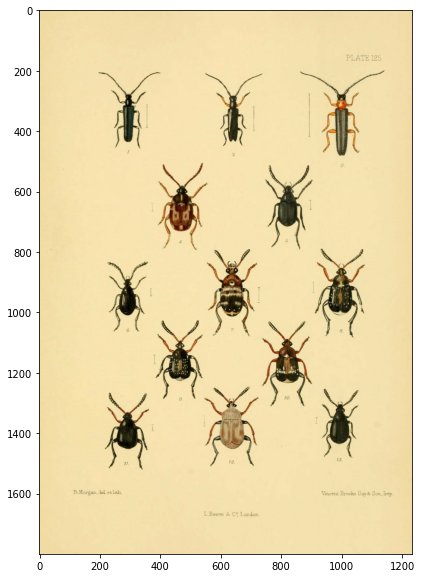

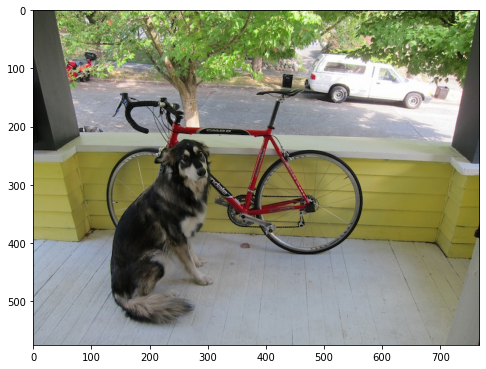

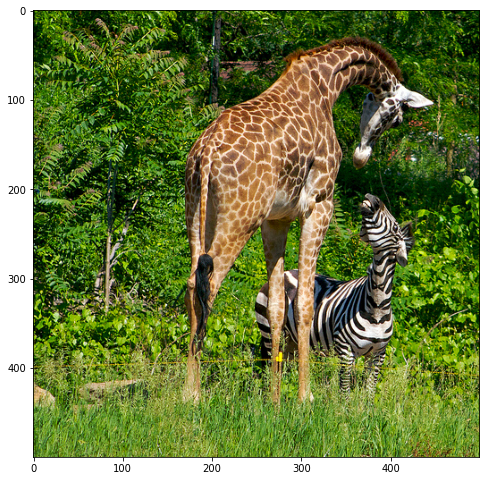

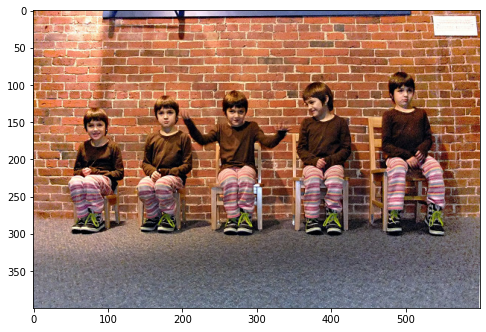

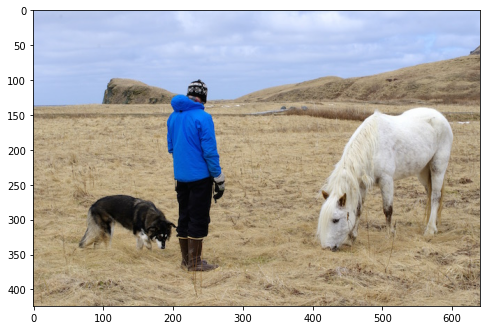

In [8]:
for img in images:
  im_h, im_w, _ = img.shape
  plt.figure(figsize=(8,10))
  plt.imshow(img) 

detection_scores.shape =  (100,)
detection_scores.shape =  (100,)
detection_scores.shape =  (100,)
detection_scores.shape =  (100,)
detection_scores.shape =  (100,)


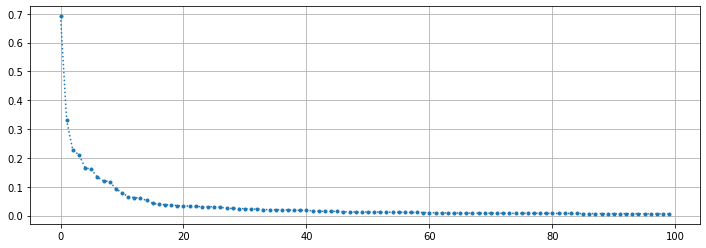

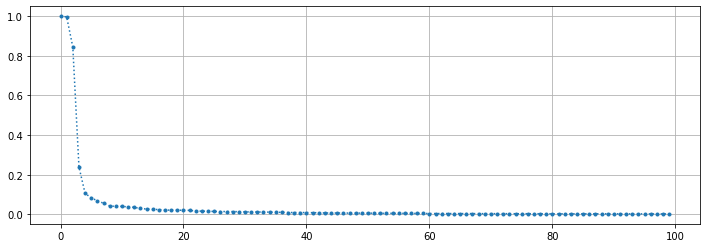

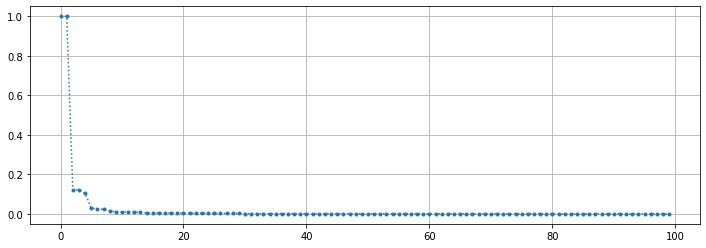

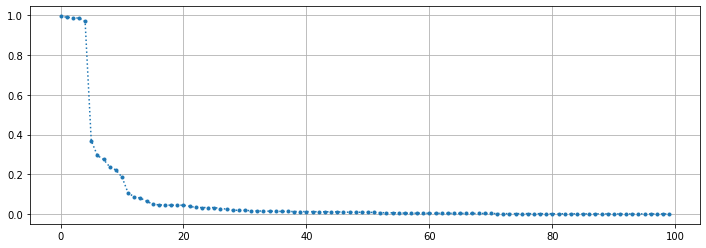

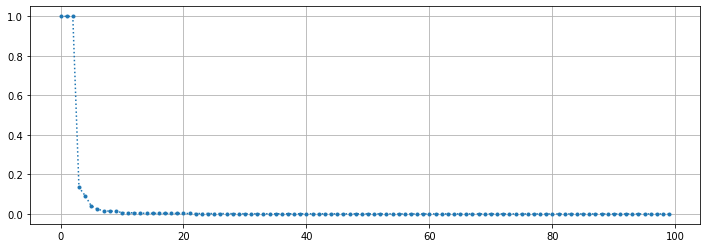

In [9]:
results = []
for img in images:
  converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]
  converted_img.shape
  result = model(converted_img)
  results.append(result)
  
  detection_scores = result['detection_scores'].numpy()[0,:]
  print('detection_scores.shape = ',detection_scores.shape)
  plt.figure(figsize=(12,4))
  plt.plot(detection_scores,'.:')
  plt.grid()

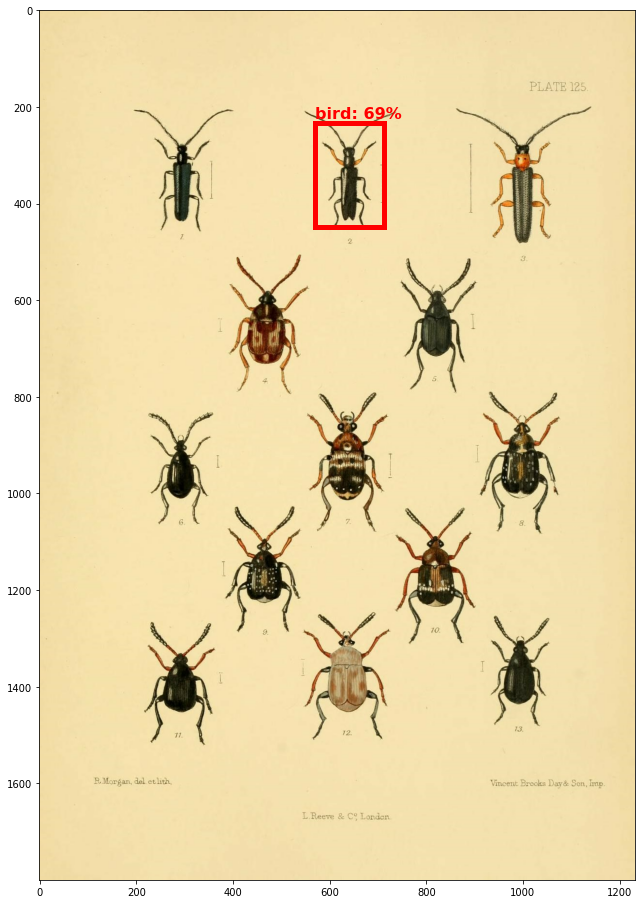

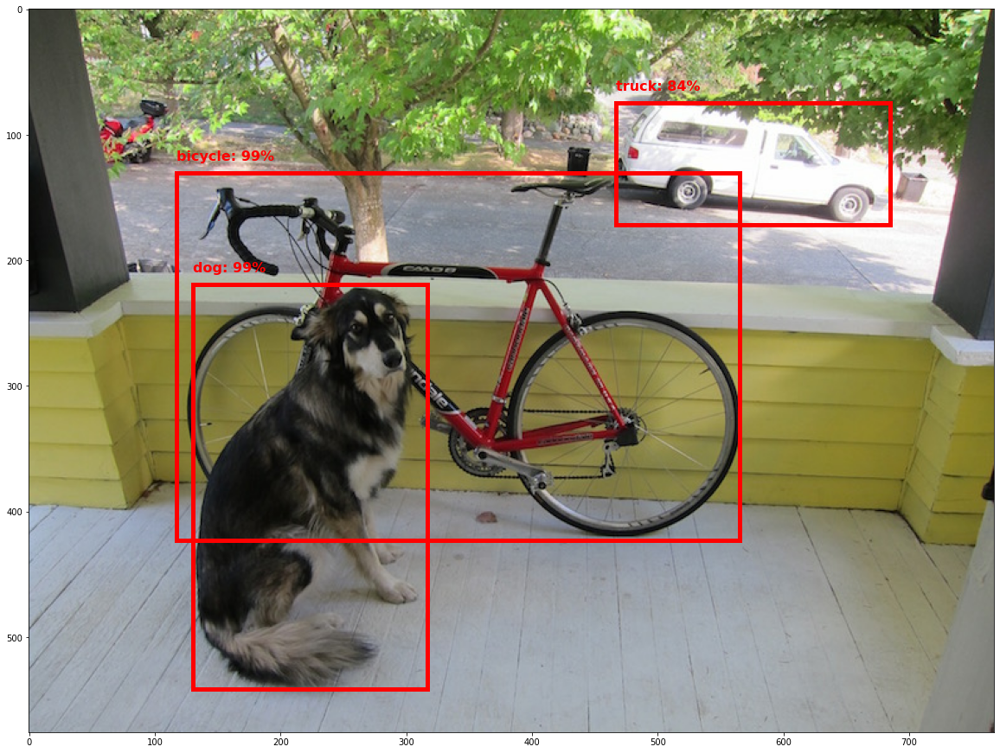

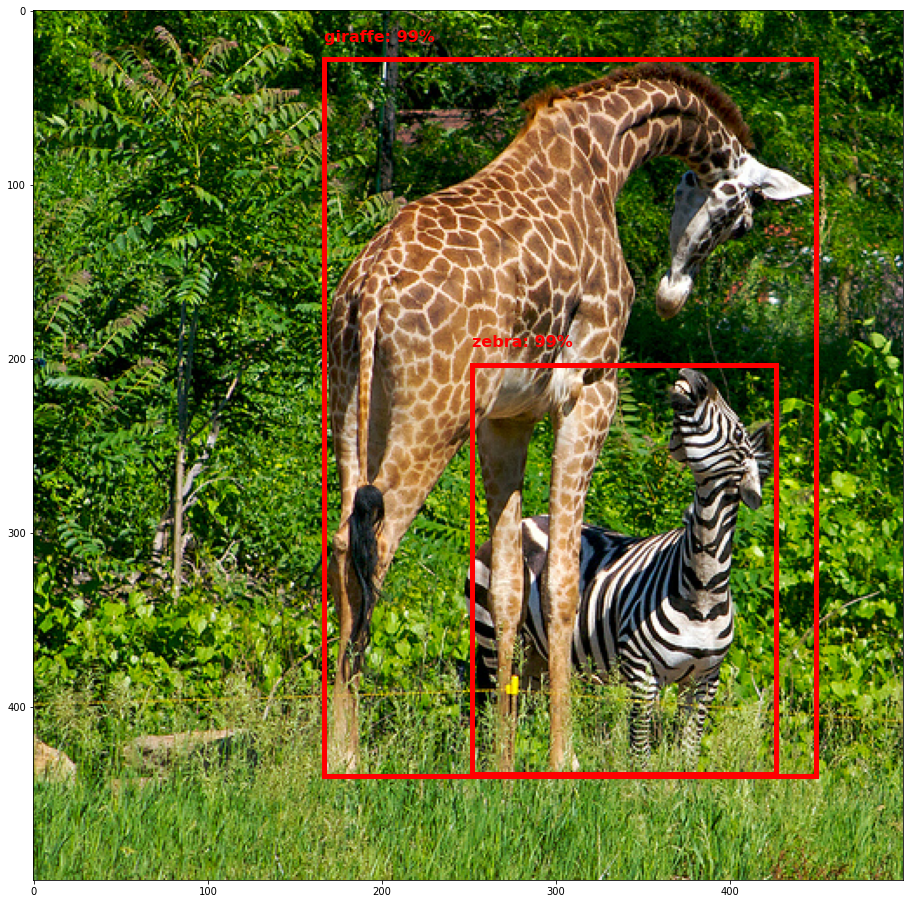

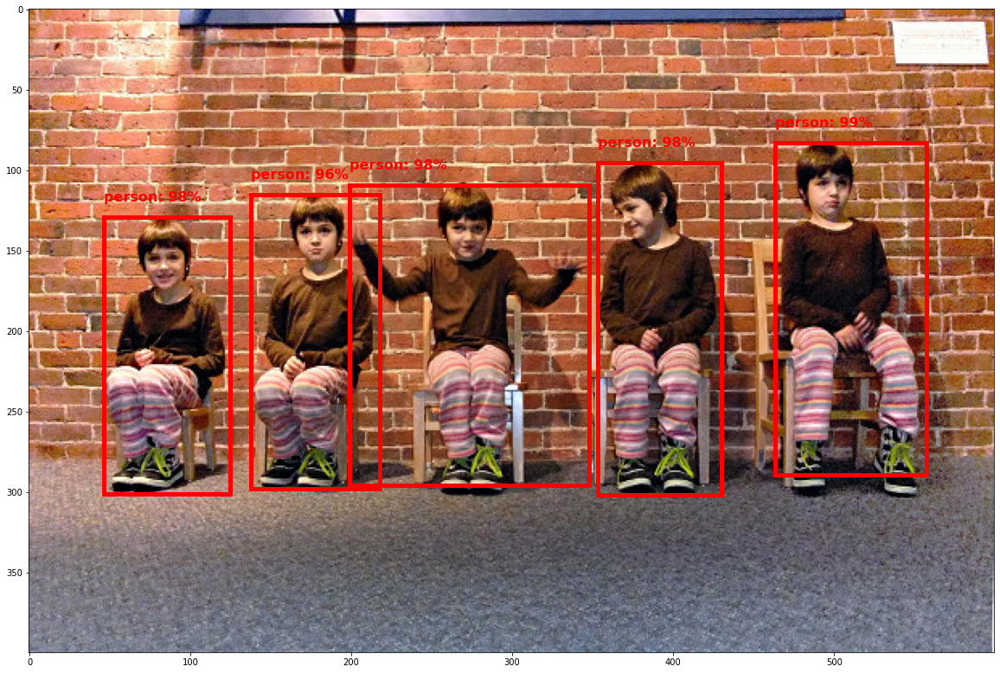

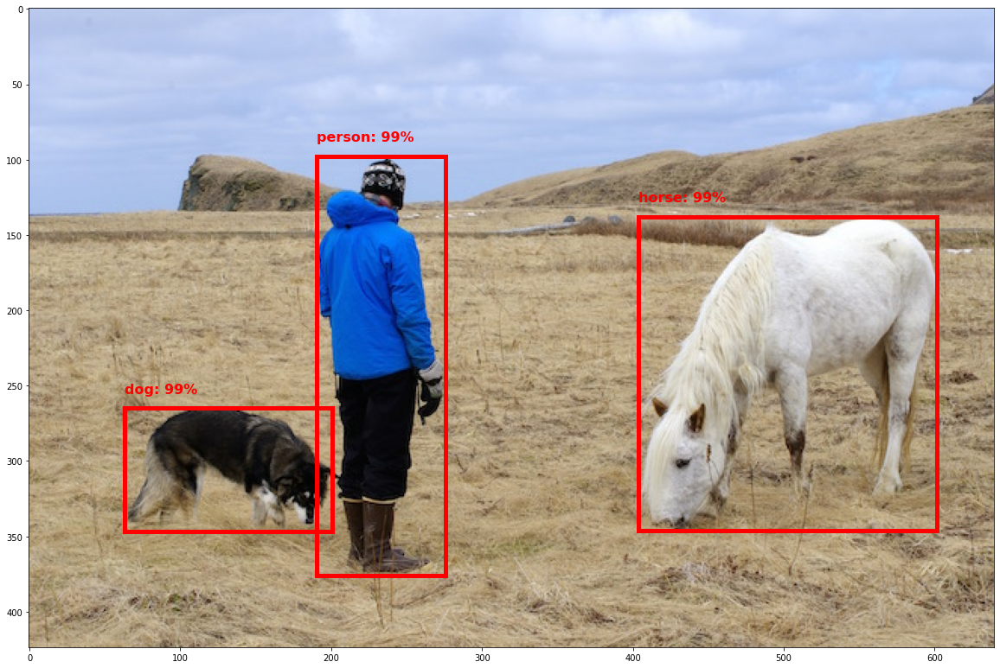

In [10]:
for image_index in range(len(results)):
  detection_boxes = results[image_index]['detection_boxes'].numpy()[0,...]
  detection_classes = results[image_index]['detection_classes'].numpy().astype(np.int)[0,:]
  detection_scores = results[image_index]['detection_scores'].numpy()[0,:]

  min_score_thresh = 0.5
  my_detection_boxes = detection_boxes[detection_scores>min_score_thresh]
  my_detection_classes = detection_classes[detection_scores>min_score_thresh]
  my_detection_scores = detection_scores[detection_scores>min_score_thresh]
  
  plt.figure(figsize=(20,16))
  plt.imshow(images[image_index])
  im_height,im_width, _ = images[image_index].shape
  ax = plt.gca()
  ## append boxes to current img
  for i in range(len(my_detection_boxes)):
    ymin, xmin, ymax, xmax = my_detection_boxes[i]
    box_x = xmin * im_width
    box_y = ymin * im_height
    box_w = (xmax-xmin) * im_width
    box_h = (ymax-ymin) * im_height
    # add a Rectangle patch to the Axes
    ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))

    txt = "{}: {}%".format(labels[my_detection_classes[i]], 
                          int(100 * my_detection_scores[i]))
    ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')
  plt.show()

---
### 2. Let's try a different model

As noticed, the 'bugs' image was not labeled correctly, as there is  no 'beetle' class in the MS-COCO dataset.

Let's pick a different model:
https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1

This model was trained over the **OpenImagesV4 dataset** (1.7M images with 600 object classes).

- Run this model on the 'bugs' image, and display the results.

Note that you can get the detection class names, directly from the model (see the `example use` section in the model's URL).

In [11]:
module_handle = 'https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1'

detector = hub.load(module_handle)


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [12]:
# converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]
#     converted_img.shape
#     result = model(converted_img)
#     results.append(result)
    
#     detection_scores = result['detection_scores'].numpy()[0,:]
#     print('detection_scores.shape = ',detection_scores.shape)
#     plt.figure(figsize=(12,4))
#     plt.plot(detection_scores,'.:')
#     plt.grid()

---
### 3. Keypoints detection

Some of the models, trained on the **MS-COCO datasets**, include not only the bounding boxes of the objects, but also a set of **17 keypoints** for each of the persons detected in the image (e.g., elbows, head, knees, hands, etc...).

Pick one such model, e.g:
https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1

As noted in the URL, these 17 keypoints are returned as:

`detection_keypoints: a tf.float32 tensor of shape [1, N, 17, 2] containing the detected keypoints.`

- For each person detected in the image, plot its 17 keypoints. In addition, draw the "skeleton" for each person, by connecting the lines between the keypoints. Use the provided mapping: `COCO17_HUMAN_POSE_KEYPOINTS`. For example: `COCO17_HUMAN_POSE_KEYPOINTS[0] = (0,1)` means that you need to draw a line between keypoint 0 to keypoint 1. See lecture slides for details.

- Run the model and display the results, for all the images containing any persons.


In [13]:
COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

In [14]:
detector = hub.load("https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1")



In [42]:
pics_name = ['kids.jpg','person.jpg']
images = []
for name in pics_name:
  img = tf.io.read_file(f'{drive_base_path}{name}')
  img = tf.image.decode_jpeg(img, channels=3)
  images.append(img.numpy())

# for img in images:
#   im_h, im_w, _ = img.shape
#   plt.figure(figsize=(8,10))
#   plt.imshow(img) 

detection_scores.shape =  (100,)
detection_scores.shape =  (100,)


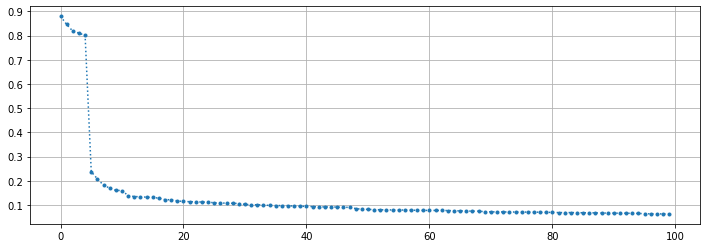

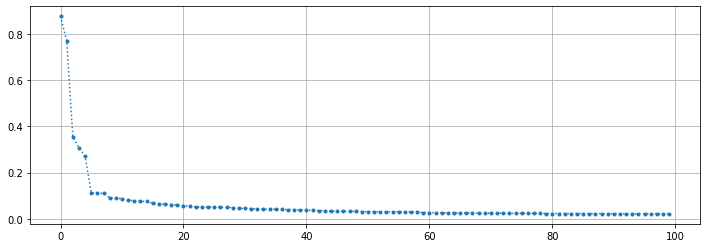

In [43]:
results = []
for img in images:
  converted_img  = tf.image.convert_image_dtype(img, tf.uint8)[tf.newaxis, ...]
  converted_img.shape
  result = detector(converted_img)
  results.append(result)
  
  detection_scores = result['detection_scores'].numpy()[0,:]
  print('detection_scores.shape = ',detection_scores.shape)
  plt.figure(figsize=(12,4))
  plt.plot(detection_scores,'.:')
  plt.grid()

In [17]:
# !git clone --depth 1 https://github.com/tensorflow/models


Cloning into 'models'...
remote: Enumerating objects: 3205, done.
remote: Counting objects: 100% (3205/3205), done.
remote: Compressing objects: 100% (2709/2709), done.
remote: Total 3205 (delta 855), reused 1369 (delta 452), pack-reused 0
Receiving objects: 100% (3205/3205), 33.40 MiB | 23.39 MiB/s, done.
Resolving deltas: 100% (855/855), done.


In [41]:
# %%bash
# sudo apt install -y protobuf-compiler
# cd models/research/
# protoc object_detection/protos/*.proto --python_out=.
# cp object_detection/packages/tf2/setup.py .
# python -m pip install .

In [19]:
# from object_detection.utils import label_map_util
# from object_detection.utils import visualization_utils as viz_utils
# from object_detection.utils import ops as utils_ops

# %matplotlib inline

In [20]:
# result = {key:value.numpy() for key,value in results[0].items()}
# print(result.keys())

dict_keys(['num_detections', 'detection_keypoints', 'detection_keypoint_scores', 'detection_boxes', 'detection_scores', 'detection_classes'])


In [21]:
# label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True) 

In [22]:
# category_index = dict()
# # {1: {'id': 1, 'name': 'dog'}, 2: {'id': 2, 'name': 'cat'}, ...}
# for key in labels:
#   name = labels[key]
#   data = {'id': key, 'name': name}
#   category_index[key] = {}
#   category_index[key]= data

In [39]:
# tmp= []
# for key in labels:
#   name = labels[key]
#   data = {'id': key, 'name': name}
#   tmp.append(data)

# category_index=label_map_util.create_category_index(tmp)

In [44]:
# from tensorflow.python.ops.numpy_ops import np_config
# np_config.enable_numpy_behavior()


# label_id_offset = 0
# image_np_with_detections = images[0].copy()

# # Use keypoints if available in detections
# keypoints, keypoint_scores = None, None
# if 'detection_keypoints' in result:
#   keypoints = result['detection_keypoints'][0]
#   keypoint_scores = result['detection_keypoint_scores'][0]

# viz_utils.visualize_boxes_and_labels_on_image_array(
#       image_np_with_detections[0],
#       result['detection_boxes'][0],
#       (result['detection_classes'][0] + label_id_offset).astype(int),
#       result['detection_scores'][0],
#       category_index,
#       use_normalized_coordinates=True,
#       max_boxes_to_draw=200,
#       min_score_thresh=.30,
#       agnostic_mode=False,
#       keypoints=keypoints,
#       keypoint_scores=keypoint_scores,
#       keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS)

# plt.figure(figsize=(24,32))
# plt.imshow(image_np_with_detections[0])
# plt.show()

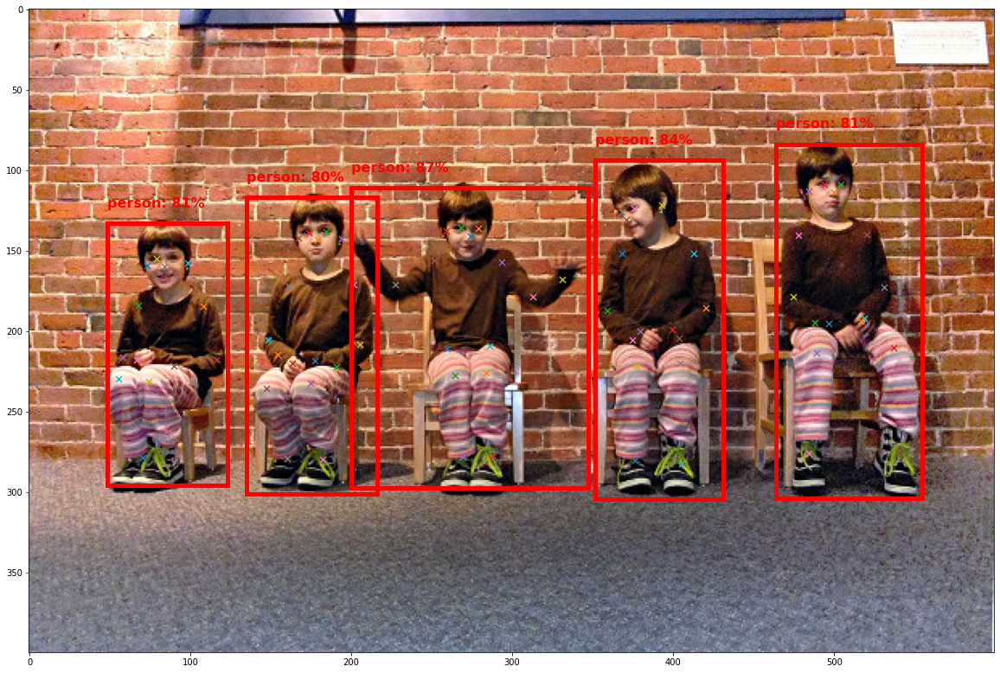

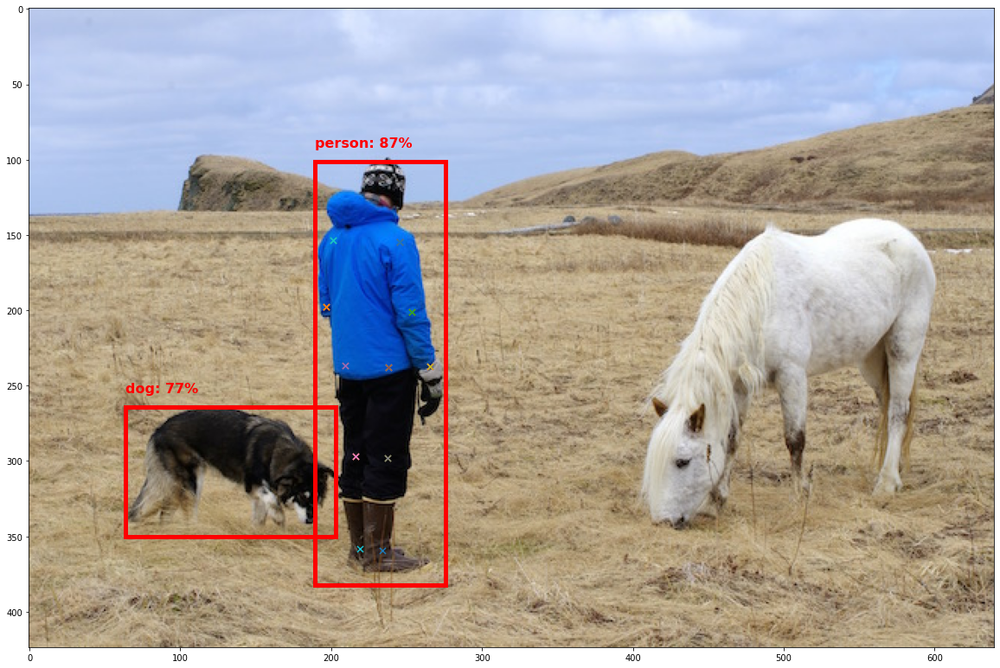

In [66]:
for image_index in range(len(results)):
  detection_boxes = results[image_index]['detection_boxes'].numpy()[0,...]
  detection_classes = results[image_index]['detection_classes'].numpy().astype(np.int)[0,:]
  detection_scores = results[image_index]['detection_scores'].numpy()[0,:]
  detection_keypoints = results[image_index]['detection_keypoints'].numpy()[0,:]
  detection_keypoint_scores = results[image_index]['detection_keypoint_scores'].numpy()[0,:]

  min_score_thresh = 0.5
  my_detection_keypoints = detection_keypoints[detection_keypoint_scores>min_score_thresh] # detection_keypoints[detection_keypoint_scores>min_score_thresh]
  my_detection_boxes = detection_boxes[detection_scores>min_score_thresh]
  my_detection_classes = detection_classes[detection_scores>min_score_thresh]
  my_detection_scores = detection_scores[detection_scores>min_score_thresh]
  
  plt.figure(figsize=(20,16))
  plt.imshow(images[image_index])
  im_height,im_width, _ = images[image_index].shape
  ax = plt.gca()
  ## append boxes to current img
  for i in range(len(my_detection_boxes)):
    ymin, xmin, ymax, xmax = my_detection_boxes[i]
    box_x = xmin * im_width
    box_y = ymin * im_height
    box_w = (xmax-xmin) * im_width
    box_h = (ymax-ymin) * im_height
    # add a Rectangle patch to the Axes
    ax.add_patch(Rectangle((box_x, box_y), box_w, box_h, linewidth=5, edgecolor='r', facecolor='none'))
    txt = "{}: {}%".format(labels[my_detection_classes[i]], 
                          int(100 * my_detection_scores[i]))
    ax.annotate(txt, xy=(box_x,box_y-10),color='r', fontsize=16, weight='bold')
  
  for keypoints in my_detection_keypoints:
    ax.scatter(keypoints[1]*im_width, keypoints[0]*im_height, marker="x", s=50, linewidths=5 )
  plt.show()

***
## Good Luck!